# Modelo de RNA com dados de potência elétrica
___

Requisitos:
* Erro Percentual Absoluto Máximo menor que 10%
* Erro Percentual Absoluto Médio menor que 3%

**Disciplina:** Automação Inteligênte

**Autor:** Miguel Marques Ferreira

**GitHub:** https://github.com/Miguel-mmf

## Bibliotecas

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
from datetime import datetime
import matplotlib.pyplot as plt
from matplotlib import rcParams
plt.style.use('default')
rcParams.update(
    {
        'figure.figsize':(16,5),
        'figure.facecolor':'white',
        'font.size':'12',
        'axes.grid': True,
        'axes.grid.axis': 'both',
        # 'text.usetex' : True,
        # 'font.family' : 'serif',
        # 'font.serif' : 'cm'
    }
)

from sklearn.preprocessing import MinMaxScaler
from distutils.dir_util import mkpath
from sklearn.metrics import (
    mean_absolute_error,
    mean_absolute_percentage_error,
    mean_squared_error,
    max_error
)
from sklearn.model_selection import train_test_split
from kerastuner import Objective
from kerastuner.tuners import RandomSearch

%matplotlib inline

2024-02-16 16:49:26.626793: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-16 16:49:26.626869: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-16 16:49:26.657025: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-16 16:49:26.736517: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-16 16:49:27.537082: W tensorflow/compiler/tf2

## Funções de apoio

In [2]:
def scale_data(df, scalers=None, scaler_type='minmax'):
    """
    Scales a dataset using either MinMaxScaler, StandardScaler or QuantileTransformer from scikit-learn.

    Parameters:
    df (pandas.DataFrame): The dataset to be scaled.
    scaler_type (str): The type of scaler to use. Either 'minmax', 'standard' or 'quantile'.

    Test:
    for s in scalers.values():
        print(s.get_params(True), end=' | ')
        print(s.data_min_, end=' | ')
        print(s.data_max_)

    Returns:
    pandas.DataFrame: The scaled dataset.
    dict: A scalers dict.
    """

    df_norm = pd.DataFrame()

    if scalers:

        for col in df.columns:
            feat = np.array(df[col])
            aux = feat.shape
            data = scalers[col].transform(feat.reshape(-1,1)) # f.transform(feat)
            df_norm[col] = data.reshape(aux)

        return df_norm

    else: # shift nas linhas abaixo

        scalers = dict()
        for col in df.columns:

            if scaler_type == 'minmax':
                scaler = MinMaxScaler(feature_range=(0.15,0.85)) # default
            # elif scaler_type == 'standard':
            #     scaler = StandardScaler()
            # elif scaler_type == 'quantile':
            #     scaler = QuantileTransformer()
            else:
                raise ValueError("Invalid scaler type. Must be 'minmax', 'standard' or 'quantile'.")

            scalers[col] = scaler
            feat = np.array(df[col])
            aux = feat.shape
            data = scalers[col].fit_transform(feat.reshape(-1,1)) # f.transform(feat)
            df_norm[col] = data.reshape(aux)

        return df_norm, scalers

In [3]:
def difference_plot(
        real_data,
        predicted_data,
        xy_labels={
            'x': 'Pontos',
            'y': 'Potência (MW)'
        },
        legends={
            'ax0': ['Potência Real','Potência Estimada'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
        filename=' ',
        save=False,
        formats=['eps', 'png', 'pdf'],
        return_fig=False
    ):
    """This function creates a figure with two subplots: the first one shows the real and predicted data, and the second one shows the difference between the real and predicted data.

    Args:
        real_data (Series): A series with the real data.
        predicted_data (Series): A series with the predicted data.
        xy_labels (dict, optional): _description_. Defaults to { 'x': 'Pontos', 'y': 'Potência (MW)' }.
        legends (dict, optional): _description_. Defaults to { 'ax0': ['Potência Real','Potência Estimada'], 'ax1': ['Diferença entre Potência Real e Estimada'] }.
        filename (str, optional): _description_. Defaults to ' '.
        save (bool, optional): _description_. Defaults to False.
        formats (list, optional): _description_. Defaults to ['eps', 'png', 'pdf'].
        return_fig (bool, optional): _description_. Defaults to False.

    Returns:
        matplotlib.figure.Figure: A figure with two subplots.
    """

    fig, axs = plt.subplots(2, 1, figsize=(12, 8), dpi=600, sharex=True)

    axs[0].plot(real_data, lw=2, color='Red', marker='s', markersize=3)
    axs[0].plot(predicted_data, lw=2, color='Blue')

    axs[1].plot(real_data - predicted_data, lw=2, color='red')
    axs[1].fill_between(
        range(0, len(predicted_data)),
        (real_data - predicted_data).ravel(),
        lw=2,
        color='red',
        alpha=0.5
    )

    for i in range(2):
        axs[i].grid(True)
        axs[i].set_ylabel(xy_labels['y'])
        axs[i].set_xlabel(xy_labels['x'])
        axs[i].legend(legends[f'ax{i}'])

    plt.tight_layout()

    if save:
        if filename == ' ':
            f = './figures/difference_plot'
        else:
            mkpath('/'.join(filename.split('/')[:-1]))
            f = filename

        for format in formats:
            plt.savefig(f'{f}.{format}', format=format, dpi=600)


    if return_fig:
        return fig, axs
    else:
        plt.show()

In [5]:
def create_mae_mse_rmse_figures(df_history, save=False, filename=' ', return_fig=False):
    """This function creates the MAE, MSE and RMSE figures for the training and validation sets.

    Args:
        df_history (DataFrame): The history of the training and validation sets.
        save (bool, optional): The flag to save the figures. Defaults to False.
        filename (str, optional): The filename to save the figures. Defaults to ' '.
    """

    cols = df_history.columns
    length_df_history = len(df_history)
    metrics = {
        'mae': 'mean_absolute_error',
        'mse': 'mean_squared_error',
        'rmse': 'root_mean_squared_error',
        # 'mape': 'mean_absolute_percentage_error',
    }

    figs = list()
    axss = list()

    for key, value in metrics.items():
        
        fig, axs = plt.subplots(1,1,figsize=(12,5),dpi=600)
        
        if key in cols:
            axs.plot(df_history[key],lw=2,color='red', label=f'Training {key.upper()}')
            axs.plot(df_history[f'val_{key}'],lw=2,color='blue', label=f'Validation {key.upper()}')
        else:
            try:
                axs.plot(df_history[value],lw=2,color='red', label=f'Training {key.upper()}')
                axs.plot(df_history[f'val_{value}'],lw=2,color='blue', label=f'Validation {key.upper()}')
            except Exception as e:
                print(e)

        axs.grid(True)
        axs.set_ylabel(key.upper(), fontsize=22)
        axs.set_xlabel('Epochs', fontsize=22)
        axs.set_xlim([0, length_df_history+1])
        # axs.set_xticks([i for i in range(0,length_df_history,2)], fontsize=20)
        axs.legend(fontsize=18)
        axs.grid(visible=True)

        figs.append(fig)
        axss.append(axs)
        
        if save:
            if filename == ' ':
                f = key.upper()
            else:
                f = filename + '_' + key.upper()
            #plt.savefig(f'{filename}.eps', format='eps', dpi=600)
            plt.savefig(f'{f}.png', format='png', dpi=600)
            #plt.savefig(f'{filename}.pdf', format='pdf', dpi=600) 

    if save:
        if filename == ' ':
            f = 'history.csv'
        else:
            f = filename + 'history.csv'

        df_history.to_csv(f)

    if return_fig:
        return figs, axss

In [4]:
def max_absolute_percentage_error(y_true, y_pred):

    # errors = list()
    y_pred = y_pred.to_numpy().reshape(1, -1)
    y_true = y_true.to_numpy().reshape(1, -1)
    epsilon = np.finfo(np.float64).eps
    max_ape = np.abs(y_pred - y_true) / np.maximum(np.abs(y_true), epsilon)
    max_ape = np.max(max_ape)

    return max_ape

## Leitura dos dados

In [6]:
data = pd.read_csv('./data_semanal.csv')
data.drop(columns=['Unnamed: 6'], inplace=True, errors='ignore')
data.set_index('TEMPO', inplace=True)
data.head()

,POTENCIA,ENERGIA,TAXA_ENERGIA,POTENCIA(K-1),ENERGIA(K-1),TAXA_ENERGIA(K-1),POTENCIA(K-2),ENERGIA(K-2),TAXA_ENERGIA(K-2),POTENCIA(K-3),ENERGIA(K-3),TAXA_ENERGIA(K-3),POTENCIA(K-4),ENERGIA(K-4),TAXA_ENERGIA(K-4),POTENCIA(K+1),POTENCIA(K+2)
TEMPO,,,,,,,,,,,,,,,,,
2008-02-03,16.000000,265.950,4.000,15.800000,266.2225,3.950,14.600000,248.2375,3.650,15.900000,266.475001,3.975,13.9,243.062499,3.475,16.299999,16.700001
2008-02-10,16.299999,269.575,4.075,16.000000,265.9500,4.000,15.800000,266.2225,3.950,14.600000,248.237500,3.650,15.9,266.475001,3.975,16.700001,17.000000
2008-02-17,16.700001,279.575,4.175,16.299999,269.5750,4.075,16.000000,265.9500,4.000,15.800000,266.222500,3.950,14.6,248.237500,3.650,17.000000,17.100000
2008-02-24,17.000000,279.550,4.250,16.700001,279.5750,4.175,16.299999,269.5750,4.075,16.000000,265.950000,4.000,15.8,266.222500,3.950,17.100000,17.299999
2008-03-02,17.100000,284.825,4.275,17.000000,279.5500,4.250,16.700001,279.5750,4.175,16.299999,269.575000,4.075,16.0,265.950000,4.000,17.299999,17.400000


## RNA 1
___
Previsão da demanda semanal considerando potência (P) e energia (E).

In [7]:
data_rna1 = data.filter(
    items=[
        # labels
        'POTENCIA(K-4)', 'POTENCIA(K-3)', 'POTENCIA(K-2)', 'POTENCIA(K-1)','POTENCIA',
        'ENERGIA(K-4)', 'ENERGIA(K-3)', 'ENERGIA(K-2)', 'ENERGIA(K-1)','ENERGIA',
        # targets
        'POTENCIA(K+1)', 'POTENCIA(K+2)'
    ]
).copy()

## Divisão dos dados de treinamento e teste
___
**Considerações:**
* 70% dos dados para treinamento;
* 15% dos dados para teste;
* 15% dos dados para validação.

In [26]:
x_train, x_test, y_train, y_test = train_test_split(
    data_rna1.drop(columns=['POTENCIA(K+1)', 'POTENCIA(K+2)']),
    data_rna1[['POTENCIA(K+1)', 'POTENCIA(K+2)']],
    test_size=0.3,
    random_state=42,
    shuffle=True
)

x_valid, x_test, y_valid, y_test = train_test_split(
    x_test,
    y_test,
    test_size=0.5,
    random_state=42,
    shuffle=True
)

x_train_scaled, x_scalers = scale_data(x_train, scaler_type='minmax')
y_train_scaled, y_scalers = scale_data(y_train, scaler_type='minmax')

x_valid_scaled = scale_data(x_valid, x_scalers)
y_valid_scaled = scale_data(y_valid, y_scalers)

x_test_scaled = scale_data(x_test, x_scalers)
y_test_scaled = scale_data(y_test, y_scalers)

In [27]:
print(f'Shape x_train: {x_train.shape}')
print(f'Shape y_train: {y_train.shape}')
print(f'Shape x_valid: {x_valid.shape}')
print(f'Shape y_valid: {y_valid.shape}')
print(f'Shape x_test: {x_test.shape}')
print(f'Shape y_test: {y_test.shape}')

Shape x_train: (215, 10)
Shape y_train: (215, 2)
Shape x_valid: (46, 10)
Shape y_valid: (46, 2)
Shape x_test: (47, 10)
Shape y_test: (47, 2)


In [143]:
mkpath('./automacao_inteligente/data/')

['automacao_inteligente/data']

In [150]:
x_train.to_csv('./automacao_inteligente/data/x_train.csv')
x_valid.to_csv('./automacao_inteligente/data/x_valid.csv')
x_test.to_csv('./automacao_inteligente/data/x_test.csv')

y_train.to_csv('./automacao_inteligente/data/y_train.csv')
y_valid.to_csv('./automacao_inteligente/data/y_valid.csv')
y_test[['POTENCIA(K+1)', 'POTENCIA(K+2)']].to_csv('./automacao_inteligente/data/y_test.csv')

### Modelo RNA1

In [87]:
tf.keras.backend.clear_session()
model_rna1 = tf.keras.models.Sequential(name='RNA_MLP_1')

model_rna1.add(tf.keras.layers.Input(x_train_scaled.shape[1], name='Input_Layer'))
model_rna1.add(tf.keras.layers.Dense(25, activation='relu', name='Hidden_Layer_1'))
model_rna1.add(tf.keras.layers.Dense(16, activation='relu', name='Hidden_Layer_2'))
# model_rna1.add(tf.keras.layers.Dense(15, activation='relu', name='Hidden_Layer_3'))
model_rna1.add(tf.keras.layers.Dense(y_test_scaled.shape[1], activation=tf.nn.sigmoid, name='Output_Layer'))

model_rna1.compile(
    optimizer='adam',
    loss='mse',
    metrics=[
        'mae',
        'mse',
        tf.keras.metrics.RootMeanSquaredError(name='rmse')
    ]
)

model_rna1.summary()

Model: "RNA_MLP_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Hidden_Layer_1 (Dense)      (None, 25)                275       
                                                                 
 Hidden_Layer_2 (Dense)      (None, 16)                416       
                                                                 
 Output_Layer (Dense)        (None, 2)                 34        
                                                                 
Total params: 725 (2.83 KB)
Trainable params: 725 (2.83 KB)


Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


#### Entradas não normalizadas

In [88]:
history = model_rna1.fit(
    x=x_train.to_numpy(),
    y=y_train.to_numpy(),
    # batch_size=32,
    validation_data=(
        x_valid.to_numpy(),
        y_valid.to_numpy()
    ),
    epochs=500
)

Epoch 1/500


7/7 [==============================] - 0s 14ms/step - loss: 356.5181 - mae: 18.7074 - mse: 356.5181 - rmse: 18.8817 - val_loss: 374.1308 - val_mae: 19.1507 - val_mse: 374.1308 - val_rmse: 19.3425
Epoch 2/500
7/7 [==============================] - 0s 3ms/step - loss: 356.5181 - mae: 18.7074 - mse: 356.5181 - rmse: 18.8817 - val_loss: 374.1308 - val_mae: 19.1507 - val_mse: 374.1308 - val_rmse: 19.3425
Epoch 3/500
7/7 [==============================] - 0s 3ms/step - loss: 356.5181 - mae: 18.7074 - mse: 356.5181 - rmse: 18.8817 - val_loss: 374.1308 - val_mae: 19.1507 - val_mse: 374.1308 - val_rmse: 19.3425
Epoch 4/500
7/7 [==============================] - 0s 3ms/step - loss: 356.5181 - mae: 18.7074 - mse: 356.5181 - rmse: 18.8817 - val_loss: 374.1308 - val_mae: 19.1507 - val_mse: 374.1308 - val_rmse: 19.3425
Epoch 5/500
7/7 [==============================] - 0s 3ms/step - loss: 356.5181 - mae: 18.7074 - mse: 356.5181 - rmse: 18.8817 - val_loss: 374.1308 - val_mae: 19.1507 - val_mse: 374.1

In [89]:
history = pd.DataFrame(history.history)
history.head()

,loss,mae,mse,rmse,val_loss,val_mae,val_mse,val_rmse
0,356.518097,18.707399,356.518097,18.881687,374.130829,19.150724,374.130829,19.342463
1,356.518097,18.707399,356.518097,18.881687,374.130829,19.150724,374.130829,19.342463
2,356.518097,18.707397,356.518097,18.881687,374.130829,19.150724,374.130829,19.342463
3,356.518127,18.707399,356.518127,18.881687,374.130829,19.150724,374.130829,19.342463
4,356.518097,18.707397,356.518097,18.881687,374.130829,19.150724,374.130829,19.342463


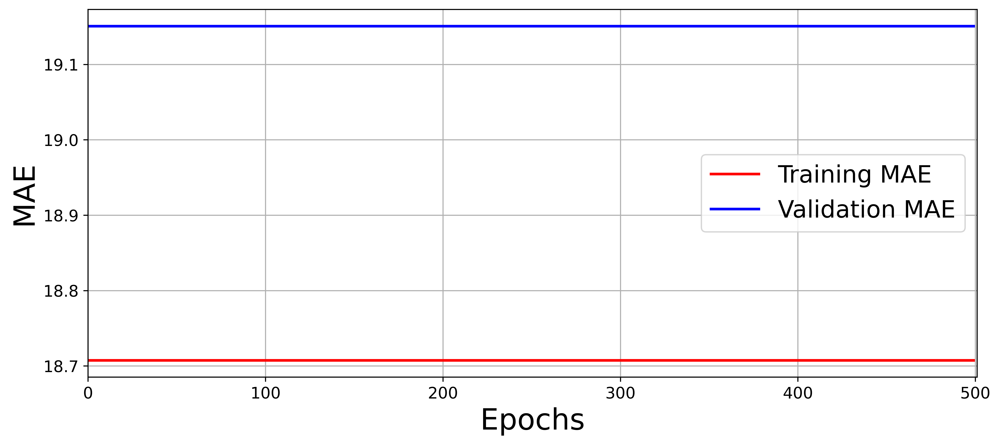

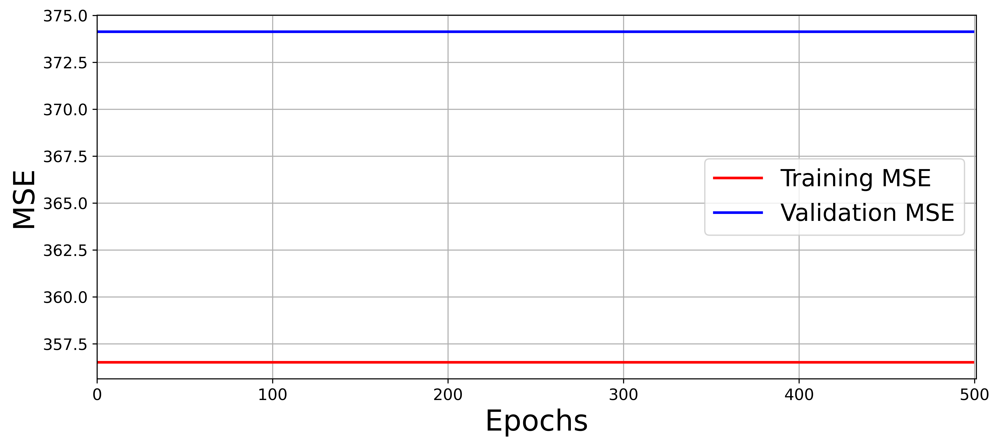

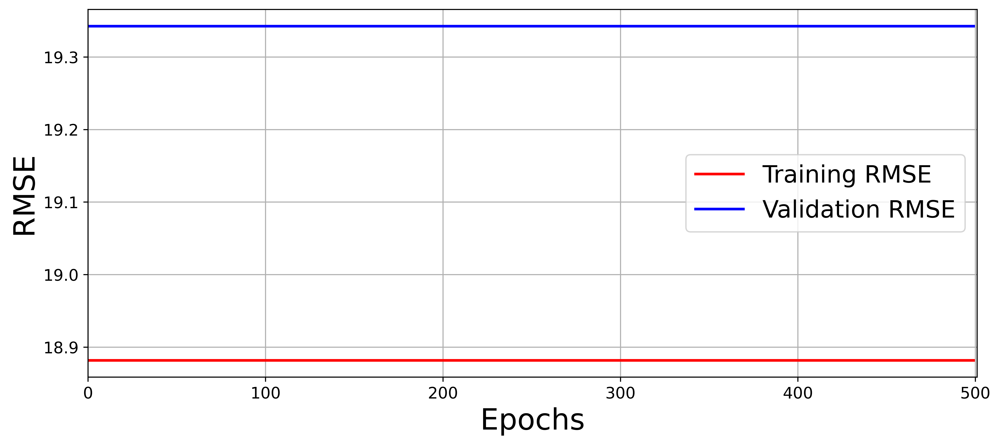

In [90]:
create_mae_mse_rmse_figures(
    history,
    save=True,
    filename='./automacao_inteligente/rna1/ent2_entradas_n_norm',
)

##### Avaliação do conjunto de teste

In [94]:
df_real_previsto = y_test.copy()
df_real_previsto.reset_index(inplace=True)
df_real_previsto.drop(columns=['TEMPO', 'index','level_0'], inplace=True, errors='ignore')
df_real_previsto.head()

,POTENCIA(K+1),POTENCIA(K+2),previsto K+1 n_norm,previsto K+2 n_norm
0,16.700001,16.900000,0.999781,0.999789
1,19.600000,19.200001,0.999781,0.999789
2,19.900000,19.700001,0.999781,0.999789
3,20.000000,18.600000,0.999781,0.999789
4,18.600000,18.100000,0.999781,0.999789


In [95]:
y_predicted = model_rna1.predict(x_test.to_numpy())
y_predicted.shape

2/2 [==============================] - 0s 1ms/step


(47, 2)

In [96]:
df_real_previsto['previsto K+1 n_norm'] = y_predicted[:,0].reshape(-1, 1)
df_real_previsto['previsto K+2 n_norm'] = y_predicted[:,1].reshape(-1, 1)

In [97]:
df_real_previsto.head()

,POTENCIA(K+1),POTENCIA(K+2),previsto K+1 n_norm,previsto K+2 n_norm
0,16.700001,16.900000,1.0,1.0
1,19.600000,19.200001,1.0,1.0
2,19.900000,19.700001,1.0,1.0
3,20.000000,18.600000,1.0,1.0
4,18.600000,18.100000,1.0,1.0


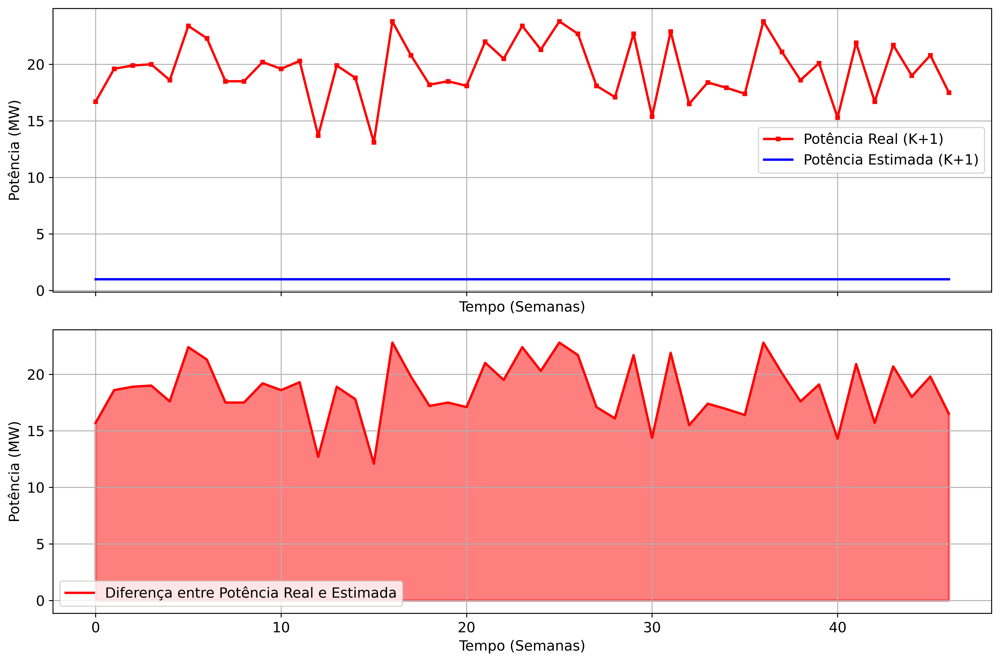

In [98]:
difference_plot(
    real_data=df_real_previsto['POTENCIA(K+1)'],
    predicted_data=df_real_previsto['previsto K+1 n_norm'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+1)','Potência Estimada (K+1)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna1/real_previsto_k1_n_norm',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

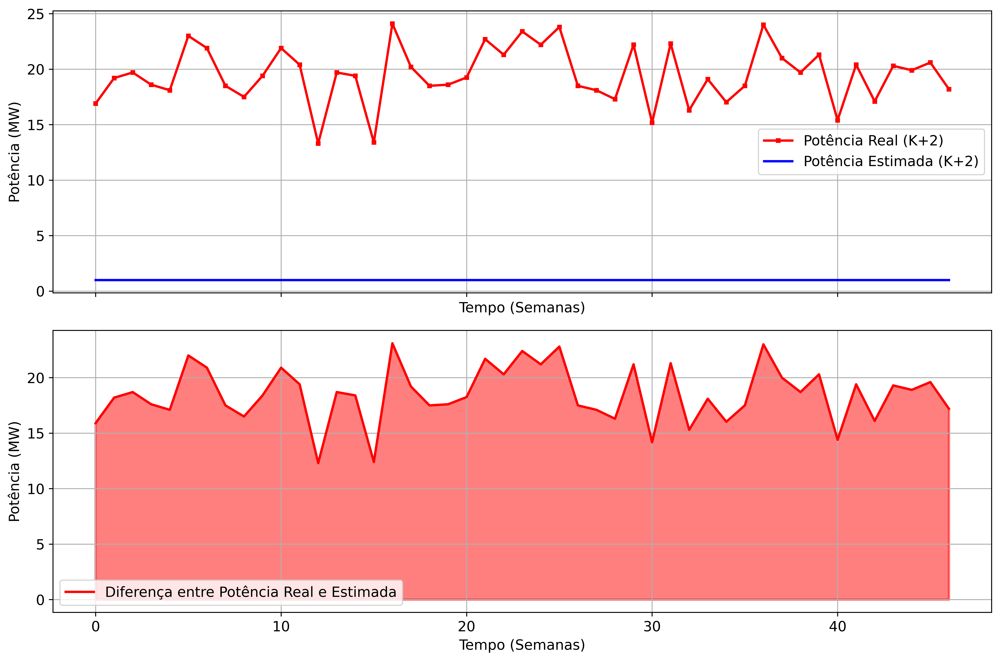

In [99]:
difference_plot(
    real_data=df_real_previsto['POTENCIA(K+2)'],
    predicted_data=df_real_previsto['previsto K+2 n_norm'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+2)','Potência Estimada (K+2)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna1/real_previsto_k2_n_norm',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

#### Entradas Normalizadas

In [100]:
history = model_rna1.fit(
    x=x_train_scaled,
    y=y_train_scaled,
    # batch_size=32,
    validation_data=(
        x_valid_scaled,
        y_valid_scaled
    ),
    epochs=500
)

Epoch 1/500


7/7 [==============================] - 0s 15ms/step - loss: 0.0224 - mae: 0.1218 - mse: 0.0224 - rmse: 0.1498 - val_loss: 0.0209 - val_mae: 0.1191 - val_mse: 0.0209 - val_rmse: 0.1447
Epoch 2/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0198 - mae: 0.1136 - mse: 0.0198 - rmse: 0.1406 - val_loss: 0.0193 - val_mae: 0.1136 - val_mse: 0.0193 - val_rmse: 0.1390
Epoch 3/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0181 - mae: 0.1096 - mse: 0.0181 - rmse: 0.1346 - val_loss: 0.0195 - val_mae: 0.1176 - val_mse: 0.0195 - val_rmse: 0.1395
Epoch 4/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0166 - mae: 0.1052 - mse: 0.0166 - rmse: 0.1286 - val_loss: 0.0167 - val_mae: 0.1065 - val_mse: 0.0167 - val_rmse: 0.1291
Epoch 5/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0151 - mae: 0.1005 - mse: 0.0151 - rmse: 0.1228 - val_loss: 0.0151 - val_mae: 0.1008 - val_mse: 0.0151 - val_rmse: 0.1229
Epoch 6/500
7/7 [===================

In [101]:
history = pd.DataFrame(history.history)
history.head()

,loss,mae,mse,rmse,val_loss,val_mae,val_mse,val_rmse
0,0.022439,0.121827,0.022439,0.149795,0.020938,0.119109,0.020938,0.144699
1,0.019773,0.113612,0.019773,0.140615,0.019326,0.113587,0.019326,0.139017
2,0.018120,0.109564,0.018120,0.134611,0.019452,0.117553,0.019452,0.139471
3,0.016550,0.105250,0.016550,0.128647,0.016674,0.106495,0.016674,0.129129
4,0.015075,0.100468,0.015075,0.122781,0.015114,0.100775,0.015114,0.122937


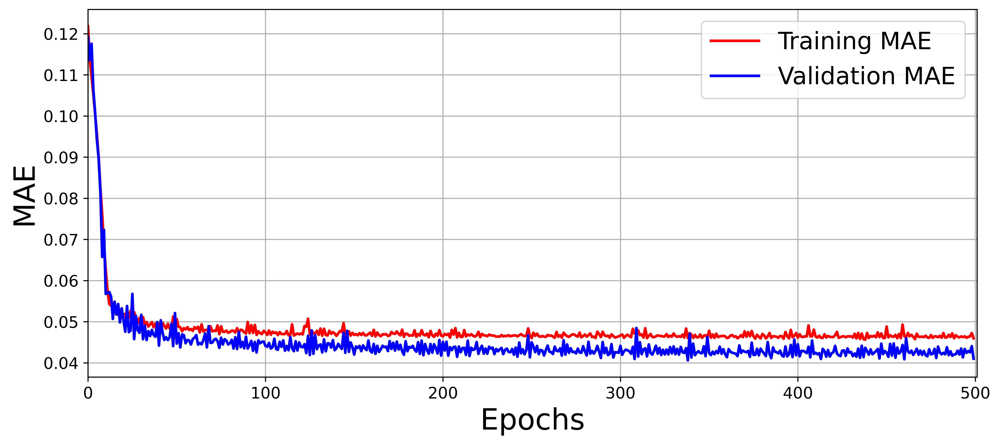

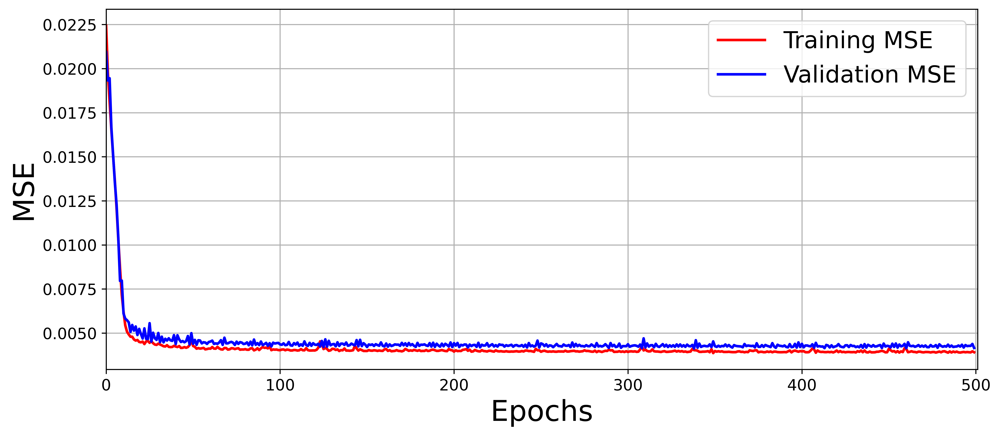

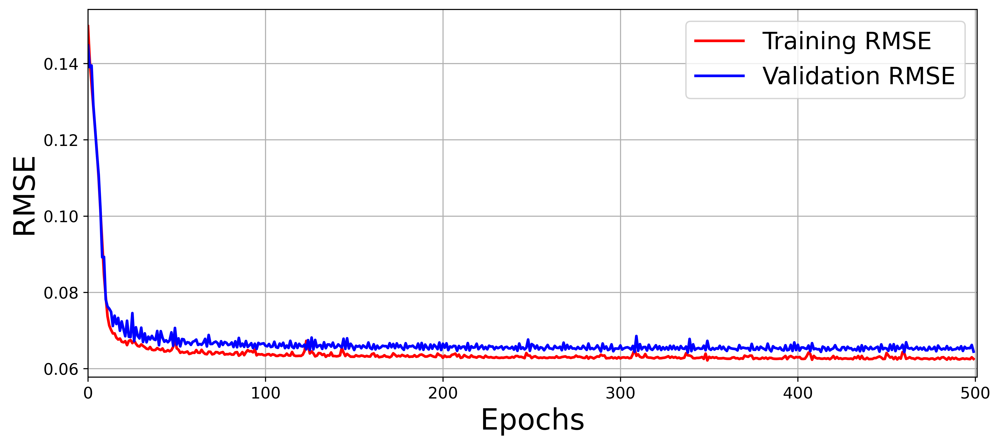

In [102]:
create_mae_mse_rmse_figures(
    history,
    save=True,
    filename='./automacao_inteligente/rna1/ent2_entradas',
)

##### Avaliação do conjunto de teste

In [103]:
df_real_previsto.head()

,POTENCIA(K+1),POTENCIA(K+2),previsto K+1 n_norm,previsto K+2 n_norm
0,16.700001,16.900000,1.0,1.0
1,19.600000,19.200001,1.0,1.0
2,19.900000,19.700001,1.0,1.0
3,20.000000,18.600000,1.0,1.0
4,18.600000,18.100000,1.0,1.0


In [104]:
y_predicted = model_rna1.predict(x_test_scaled)
y_predicted.shape

2/2 [==============================] - 0s 1ms/step


(47, 2)

In [105]:
df_real_previsto['previsto K+1 norm'] = y_scalers['POTENCIA(K+1)'].inverse_transform(y_predicted[:,0].reshape(-1, 1))
df_real_previsto['previsto K+2 norm'] = y_scalers['POTENCIA(K+2)'].inverse_transform(y_predicted[:,1].reshape(-1, 1))

In [106]:
df_real_previsto.head()

,POTENCIA(K+1),POTENCIA(K+2),previsto K+1 n_norm,previsto K+2 n_norm,previsto K+1 norm,previsto K+2 norm
0,16.700001,16.900000,1.0,1.0,16.367498,16.507977
1,19.600000,19.200001,1.0,1.0,19.626148,19.602320
2,19.900000,19.700001,1.0,1.0,20.029982,19.993841
3,20.000000,18.600000,1.0,1.0,18.732519,18.779348
4,18.600000,18.100000,1.0,1.0,18.382635,18.427418


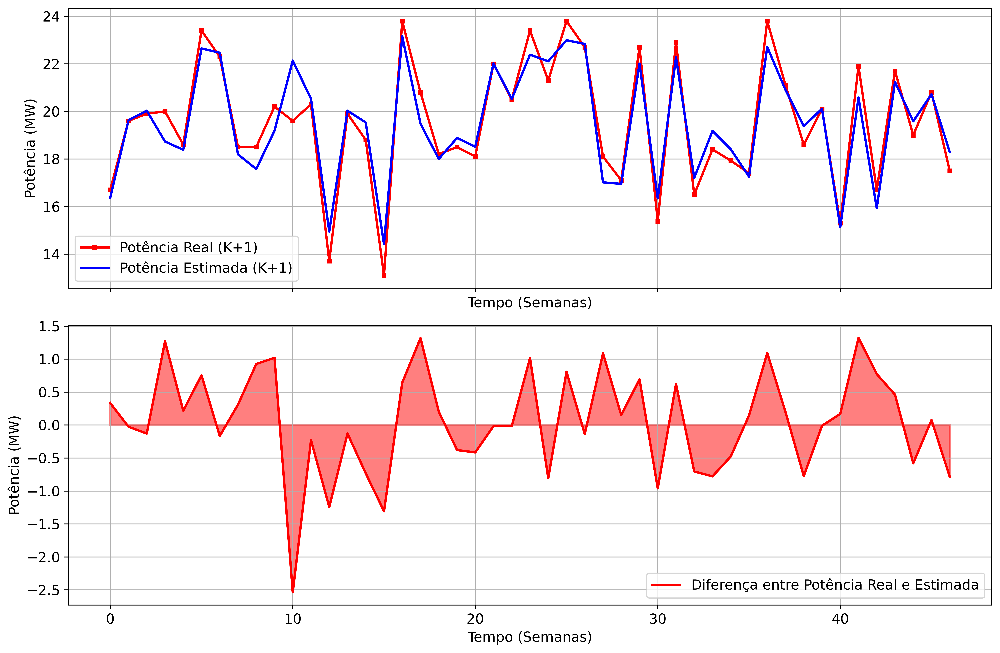

In [107]:
difference_plot(
    real_data=df_real_previsto['POTENCIA(K+1)'],
    predicted_data=df_real_previsto['previsto K+1 norm'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+1)','Potência Estimada (K+1)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna1/real_previsto_k1',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

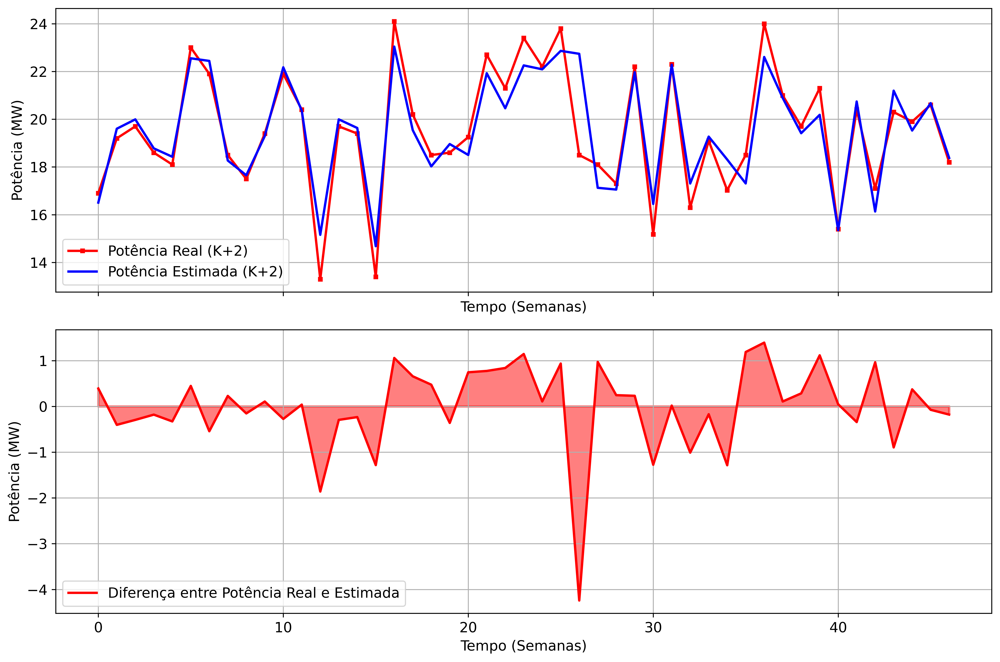

In [108]:
difference_plot(
    real_data=df_real_previsto['POTENCIA(K+2)'],
    predicted_data=df_real_previsto['previsto K+2 norm'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+2)','Potência Estimada (K+2)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna1/real_previsto_k2',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

### Modelo RNA2

In [133]:
tf.keras.backend.clear_session()
model_rna2 = tf.keras.models.Sequential(name='RNA_MLP_2')

model_rna2.add(tf.keras.layers.Input(x_train_scaled.shape[1], name='Input_Layer'))
model_rna2.add(tf.keras.layers.Dense(25, activation='relu', name='Hidden_Layer_1'))
model_rna2.add(tf.keras.layers.Dense(16, activation='relu', name='Hidden_Layer_2'))
# model_rna2.add(tf.keras.layers.Dense(15, activation='relu', name='Hidden_Layer_3'))
model_rna2.add(tf.keras.layers.Dense(y_test_scaled.shape[1], activation=tf.nn.sigmoid, name='Output_Layer'))

model_rna2.compile(
    optimizer='adam',
    loss='mse',
    metrics=[
        'mae',
        'mse',
        tf.keras.metrics.RootMeanSquaredError(name='rmse')
    ]
)

model_rna2.summary()

Model: "RNA_MLP_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Hidden_Layer_1 (Dense)      (None, 25)                275       
                                                                 
 Hidden_Layer_2 (Dense)      (None, 16)                416       
                                                                 
 Output_Layer (Dense)        (None, 2)                 34        
                                                                 
Total params: 725 (2.83 KB)
Trainable params: 725 (2.83 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


#### Entradas não normalizadas

In [134]:
history = model_rna2.fit(
    x=x_train.to_numpy(),
    y=y_train.to_numpy(),
    # batch_size=32,
    validation_data=(
        x_valid.to_numpy(),
        y_valid.to_numpy()
    ),
    epochs=500
)

Epoch 1/500
7/7 [==============================] - 0s 14ms/step - loss: 356.5181 - mae: 18.7074 - mse: 356.5181 - rmse: 18.8817 - val_loss: 374.1308 - val_mae: 19.1507 - val_mse: 374.1308 - val_rmse: 19.3425
Epoch 2/500
7/7 [==============================] - 0s 3ms/step - loss: 356.5181 - mae: 18.7074 - mse: 356.5181 - rmse: 18.8817 - val_loss: 374.1308 - val_mae: 19.1507 - val_mse: 374.1308 - val_rmse: 19.3425
Epoch 3/500
7/7 [==============================] - 0s 3ms/step - loss: 356.5181 - mae: 18.7074 - mse: 356.5181 - rmse: 18.8817 - val_loss: 374.1308 - val_mae: 19.1507 - val_mse: 374.1308 - val_rmse: 19.3425
Epoch 4/500
7/7 [==============================] - 0s 3ms/step - loss: 356.5181 - mae: 18.7074 - mse: 356.5181 - rmse: 18.8817 - val_loss: 374.1308 - val_mae: 19.1507 - val_mse: 374.1308 - val_rmse: 19.3425
Epoch 5/500
7/7 [==============================] - 0s 3ms/step - loss: 356.5181 - mae: 18.7074 - mse: 356.5181 - rmse: 18.8817 - val_loss: 374.1308 - val_mae: 19.1507 - va

In [135]:
history = pd.DataFrame(history.history)
history.head()

,loss,mae,mse,rmse,val_loss,val_mae,val_mse,val_rmse
0,356.518097,18.707399,356.518097,18.881687,374.130829,19.150724,374.130829,19.342463
1,356.518097,18.707399,356.518097,18.881687,374.130829,19.150724,374.130829,19.342463
2,356.518097,18.707397,356.518097,18.881687,374.130829,19.150724,374.130829,19.342463
3,356.518097,18.707399,356.518097,18.881687,374.130829,19.150724,374.130829,19.342463
4,356.518097,18.707399,356.518097,18.881687,374.130829,19.150724,374.130829,19.342463


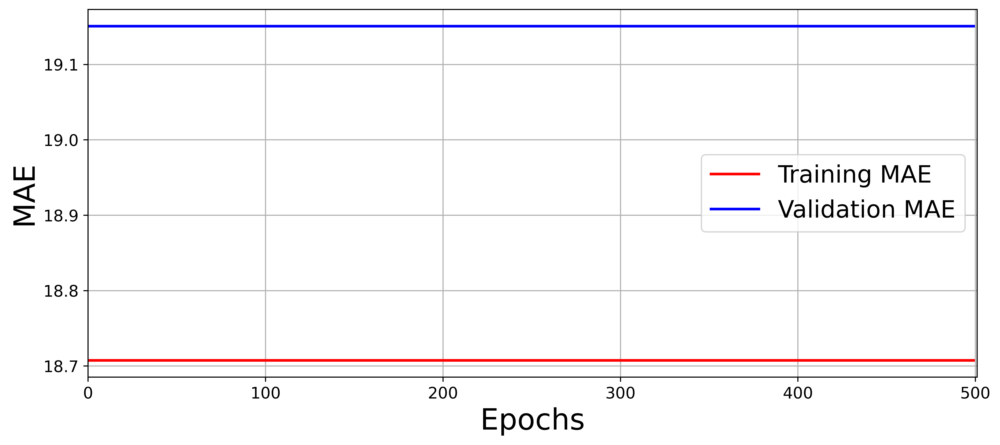

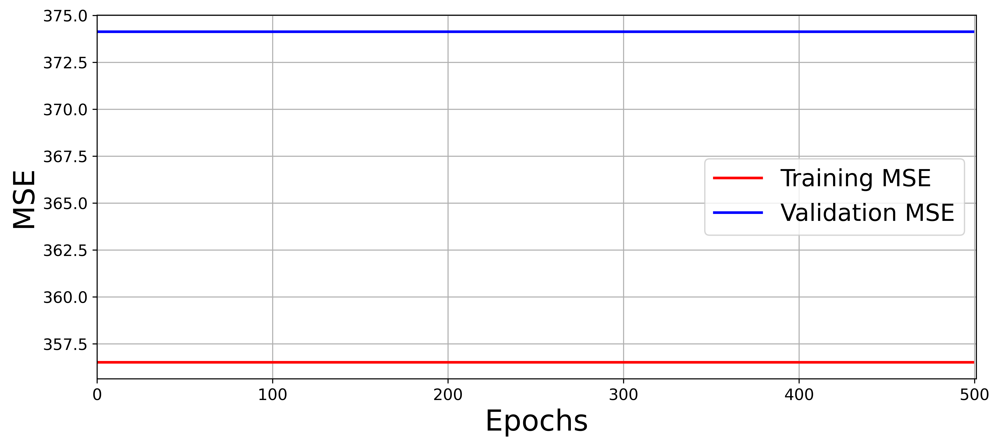

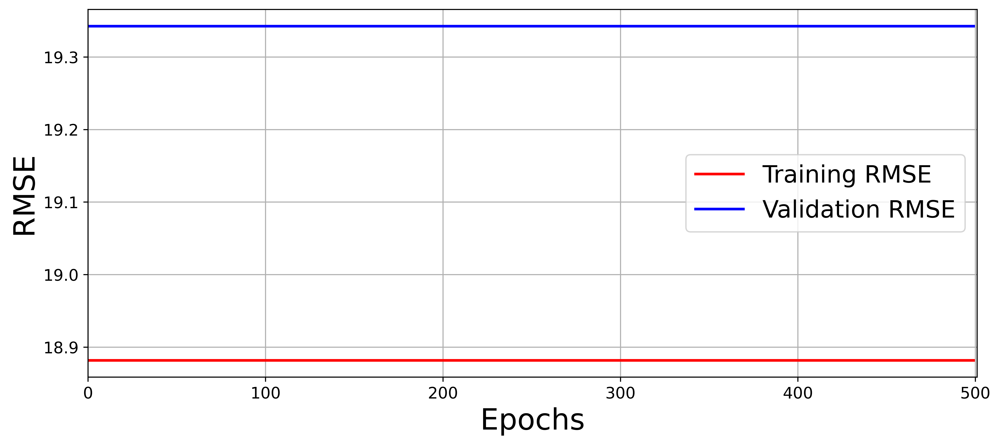

In [136]:
create_mae_mse_rmse_figures(
    history,
    save=True,
    filename='./automacao_inteligente/rna2/ent2_entradas_n_norm',
)

##### Avaliação do conjunto de teste

In [137]:
df_real_previsto2 = y_test[['POTENCIA(K+1)', 'POTENCIA(K+2)']].copy()
df_real_previsto2.reset_index(inplace=True)
df_real_previsto2.drop(columns=['TEMPO', 'index','level_0'], inplace=True, errors='ignore')
df_real_previsto2.head()

,POTENCIA(K+1),POTENCIA(K+2)
0,16.700001,16.900000
1,19.600000,19.200001
2,19.900000,19.700001
3,20.000000,18.600000
4,18.600000,18.100000


In [138]:
y_predicted = model_rna2.predict(x_test.to_numpy())
y_predicted.shape

2/2 [==============================] - 0s 817us/step


(47, 2)

In [139]:
df_real_previsto2['previsto K+1 n_norm'] = y_predicted[:,0].reshape(-1, 1)
df_real_previsto2['previsto K+2 n_norm'] = y_predicted[:,1].reshape(-1, 1)

In [140]:
df_real_previsto2.head()

,POTENCIA(K+1),POTENCIA(K+2),previsto K+1 n_norm,previsto K+2 n_norm
0,16.700001,16.900000,1.0,1.0
1,19.600000,19.200001,1.0,1.0
2,19.900000,19.700001,1.0,1.0
3,20.000000,18.600000,1.0,1.0
4,18.600000,18.100000,1.0,1.0


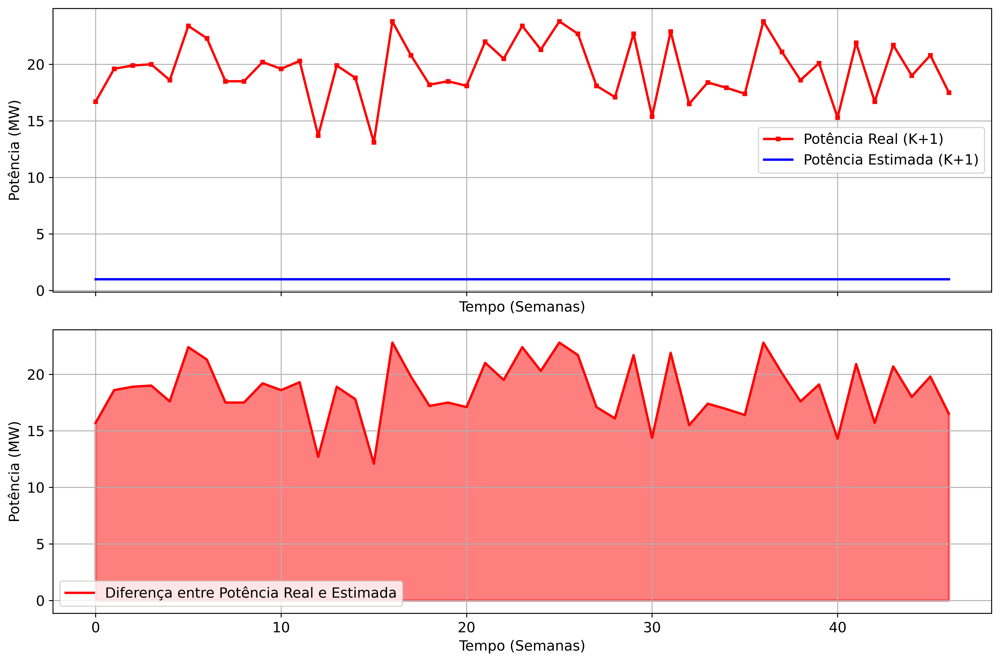

In [141]:
difference_plot(
    real_data=df_real_previsto2['POTENCIA(K+1)'],
    predicted_data=df_real_previsto2['previsto K+1 n_norm'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+1)','Potência Estimada (K+1)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna2/real_previsto_k1_n_norm',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

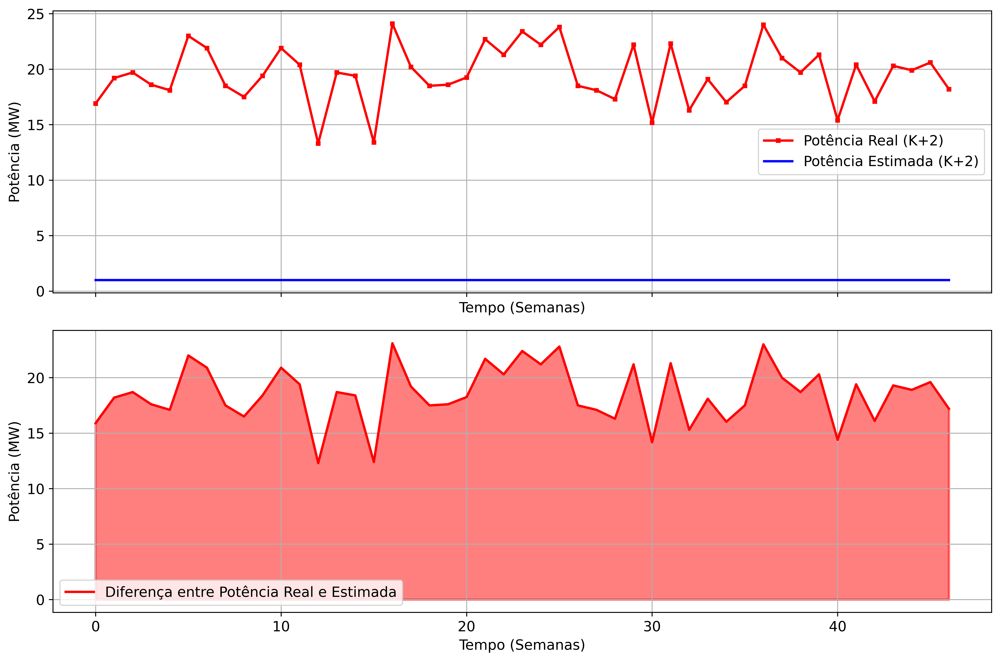

In [142]:
difference_plot(
    real_data=df_real_previsto2['POTENCIA(K+2)'],
    predicted_data=df_real_previsto2['previsto K+2 n_norm'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+2)','Potência Estimada (K+2)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna2/real_previsto_k2_n_norm',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

#### Entradas Normalizadas

In [124]:
history = model_rna2.fit(
    x=x_train_scaled,
    y=y_train_scaled,
    # batch_size=32,
    validation_data=(
        x_valid_scaled,
        y_valid_scaled
    ),
    epochs=500
)

Epoch 1/500


7/7 [==============================] - 0s 14ms/step - loss: 0.0242 - mae: 0.1289 - mse: 0.0242 - rmse: 0.1555 - val_loss: 0.0261 - val_mae: 0.1379 - val_mse: 0.0261 - val_rmse: 0.1615
Epoch 2/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0214 - mae: 0.1199 - mse: 0.0214 - rmse: 0.1464 - val_loss: 0.0223 - val_mae: 0.1248 - val_mse: 0.0223 - val_rmse: 0.1492
Epoch 3/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0199 - mae: 0.1149 - mse: 0.0199 - rmse: 0.1410 - val_loss: 0.0205 - val_mae: 0.1190 - val_mse: 0.0205 - val_rmse: 0.1431
Epoch 4/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0186 - mae: 0.1114 - mse: 0.0186 - rmse: 0.1365 - val_loss: 0.0198 - val_mae: 0.1173 - val_mse: 0.0198 - val_rmse: 0.1405
Epoch 5/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0176 - mae: 0.1081 - mse: 0.0176 - rmse: 0.1325 - val_loss: 0.0181 - val_mae: 0.1110 - val_mse: 0.0181 - val_rmse: 0.1344
Epoch 6/500
7/7 [===================

In [125]:
history = pd.DataFrame(history.history)
history.head()

,loss,mae,mse,rmse,val_loss,val_mae,val_mse,val_rmse
0,0.024191,0.128913,0.024191,0.155533,0.026085,0.137943,0.026085,0.161508
1,0.021447,0.119857,0.021447,0.146448,0.022251,0.124751,0.022251,0.149169
2,0.019884,0.114854,0.019884,0.141011,0.020465,0.118996,0.020465,0.143057
3,0.018623,0.111370,0.018623,0.136466,0.019754,0.117265,0.019754,0.140547
4,0.017561,0.108093,0.017561,0.132520,0.018052,0.110951,0.018052,0.134359


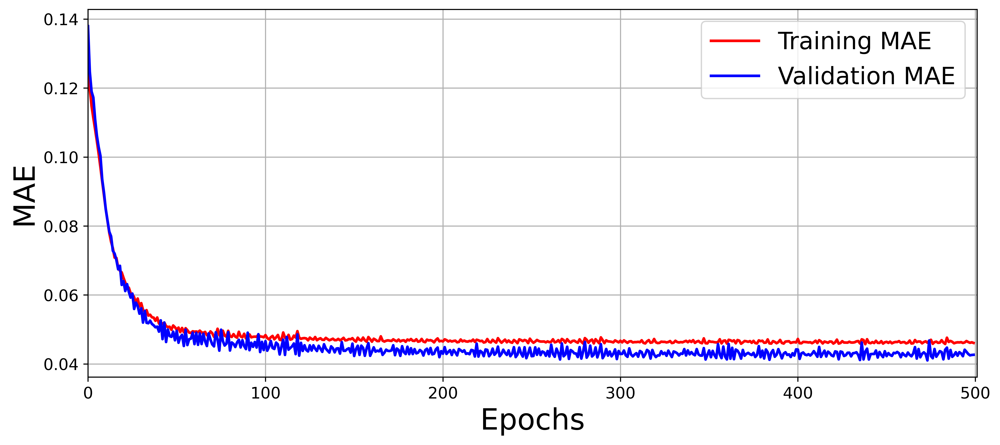

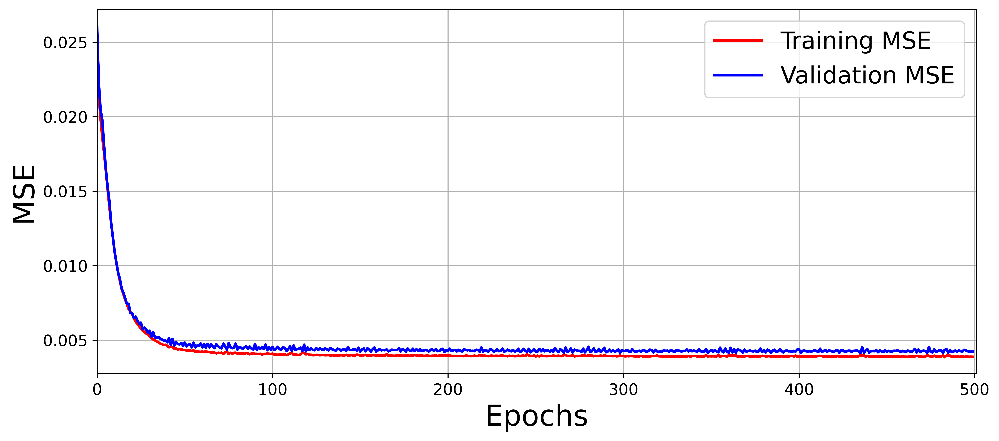

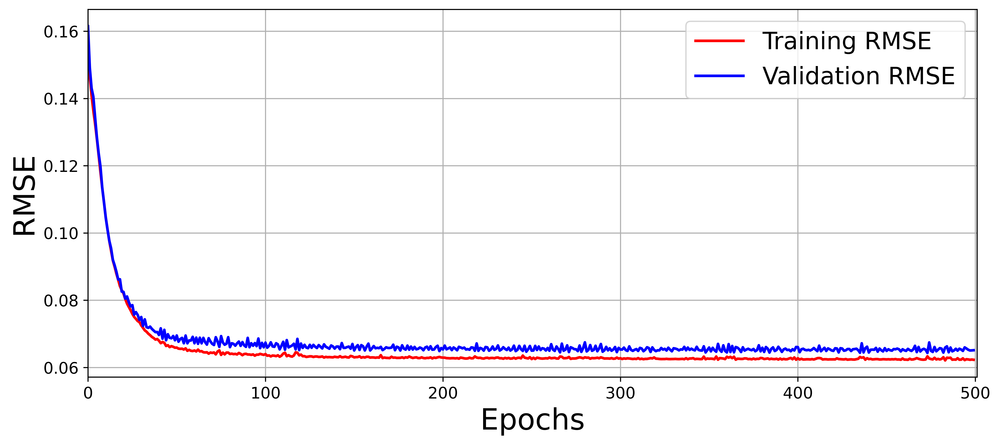

In [126]:
create_mae_mse_rmse_figures(
    history,
    save=True,
    filename='./automacao_inteligente/rna2/ent2_entradas_norm',
)

##### Avaliação do conjunto de teste

In [127]:
df_real_previsto2.head()

,POTENCIA(K+1),POTENCIA(K+2),previsto K+1 n_norm,previsto K+2 n_norm
0,16.700001,16.900000,1.0,1.0
1,19.600000,19.200001,1.0,1.0
2,19.900000,19.700001,1.0,1.0
3,20.000000,18.600000,1.0,1.0
4,18.600000,18.100000,1.0,1.0


In [128]:
y_predicted = model_rna2.predict(x_test_scaled)
y_predicted.shape

2/2 [==============================] - 0s 901us/step


(47, 2)

In [129]:
df_real_previsto2['previsto K+1 norm'] = y_scalers['POTENCIA(K+1)'].inverse_transform(y_predicted[:,0].reshape(-1, 1))
df_real_previsto2['previsto K+2 norm'] = y_scalers['POTENCIA(K+2)'].inverse_transform(y_predicted[:,1].reshape(-1, 1))

In [130]:
df_real_previsto2.head()

,POTENCIA(K+1),POTENCIA(K+2),previsto K+1 n_norm,previsto K+2 n_norm,previsto K+1 norm,previsto K+2 norm
0,16.700001,16.900000,1.0,1.0,16.256830,16.460510
1,19.600000,19.200001,1.0,1.0,19.485861,19.548334
2,19.900000,19.700001,1.0,1.0,19.832649,19.883635
3,20.000000,18.600000,1.0,1.0,18.743462,18.775417
4,18.600000,18.100000,1.0,1.0,18.401400,18.399397


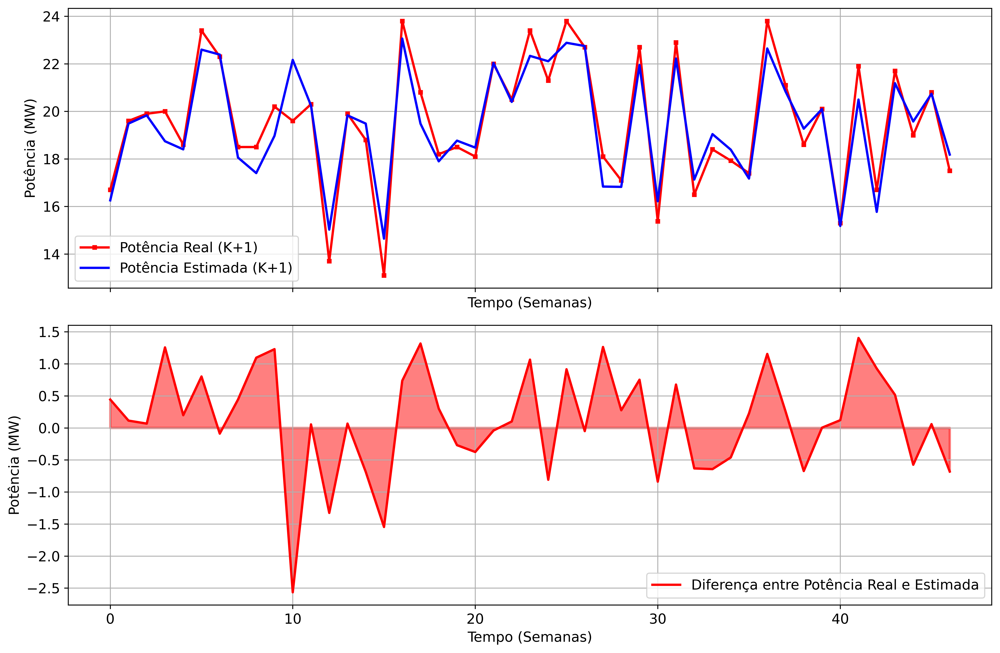

In [131]:
difference_plot(
    real_data=df_real_previsto2['POTENCIA(K+1)'],
    predicted_data=df_real_previsto2['previsto K+1 norm'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+1)','Potência Estimada (K+1)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna2/real_previsto_k1',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

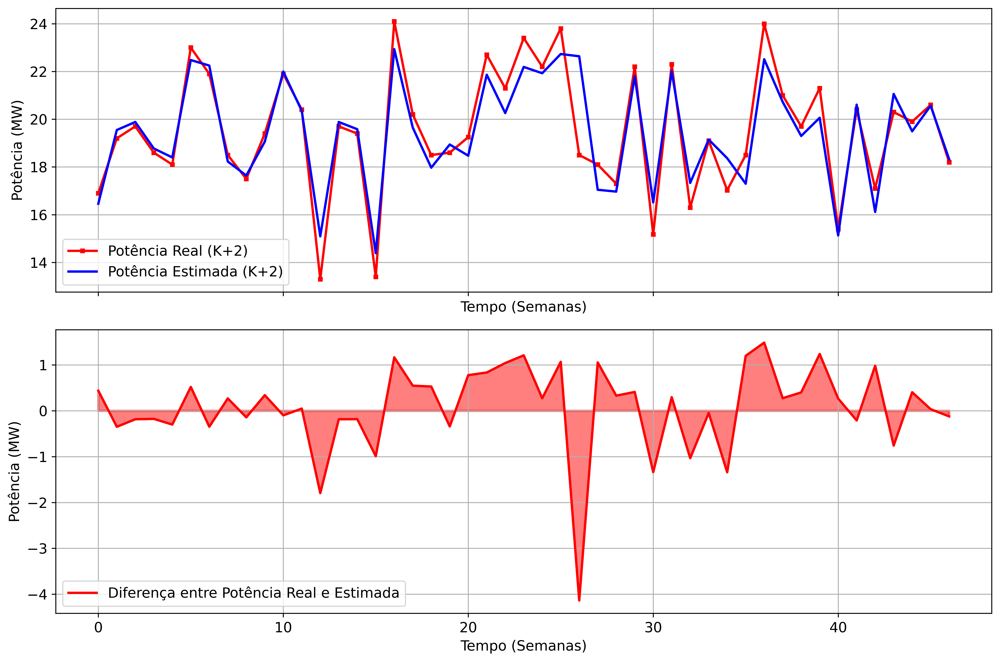

In [132]:
difference_plot(
    real_data=df_real_previsto2['POTENCIA(K+2)'],
    predicted_data=df_real_previsto2['previsto K+2 norm'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+2)','Potência Estimada (K+2)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna2/real_previsto_k2',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)